In [ ]:
# Load the packages
import numpy as np 
import pandas as pd 
from matplotlib import pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.metrics import precision_recall_curve, f1_score, precision_score, recall_score
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

seed = 42

# Data exploration

In [ ]:
data = pd.read_csv("../creditcard.csv")

In [ ]:
# Get familiar with the column names
print(data.columns)

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')


In [ ]:
# Check data types
print(data.dtypes)

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object


In [ ]:
# Descriptive Statistics
print(data.describe())

                Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.165980e-15  3.416908e-16 -1.373150e-15  2.086869e-15   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.548556e-02  1.798463e-01 -1.984653e-02   
75%    139320.500000  1.315642e+00  8.037239e-01  1.027196e+00  7.433413e-01   
max    172792.000000  2.454930e+00  2.205773e+01  9.382558e+00  1.687534e+01   

                 V5            V6            V7            V8            V9  \
count  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean   9.604066e-16  1.490107e-15 -5.556467e-16  1.177556e-16 -2.406455e-15   
std    1.380247e+00  1.332271e+00  1.23709

## What is the dimension of the dataset?
### We have 284807 transcations and 30 features with 1 being the output class

In [ ]:
# Explore the number of rows and columns
data.shape # We have 284807 transcations and 30 features with 1 being the output class

(284807, 31)

## Are there any missing values?
### No missing values

In [ ]:
# Check missing values
droppedna = data.dropna() # drop the rows that have at least one element missing
droppedna.shape # Verify the dimension of the data and it is the same as the original dimension

(284807, 31)

## What is the class distribution?
### The output are highly imbalanced. Class 1 (fraud cases) is only 0.17% of all the outputs

In [ ]:
# class distribution at a glance
print(data.groupby(['Class']).size())
num_class0 = data.groupby(['Class']).size()[0]
num_class1 = data.groupby(['Class']).size()[1]
percentage = num_class1/(data.shape[0]) * 100
print("The percentage of class 1 in the entire dataset is: %5.5f" %  percentage) 

Class
0    284315
1       492
dtype: int64
The percentage of class 1 in the entire dataset is: 0.17275


## What is the distribution of the transaction time?
### It shows a bimodel distribution

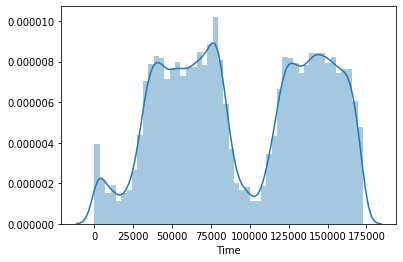

In [ ]:
sns.distplot(data['Time'])

## What is the relationship between time and amount?
### We can see that the more transcaction records, the more it is likely to appear a higher amount.

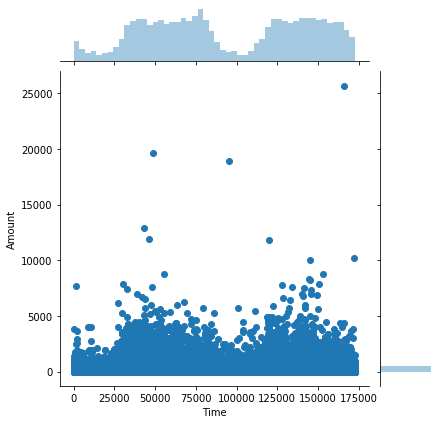

In [ ]:
sns.jointplot(x="Time", y="Amount", data=data[["Time","Amount"]]);

## The distribution of the data

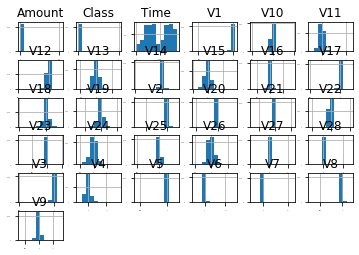

In [ ]:
data.hist(sharex=False, sharey=False, xlabelsize=1, ylabelsize=1)
plt.show()

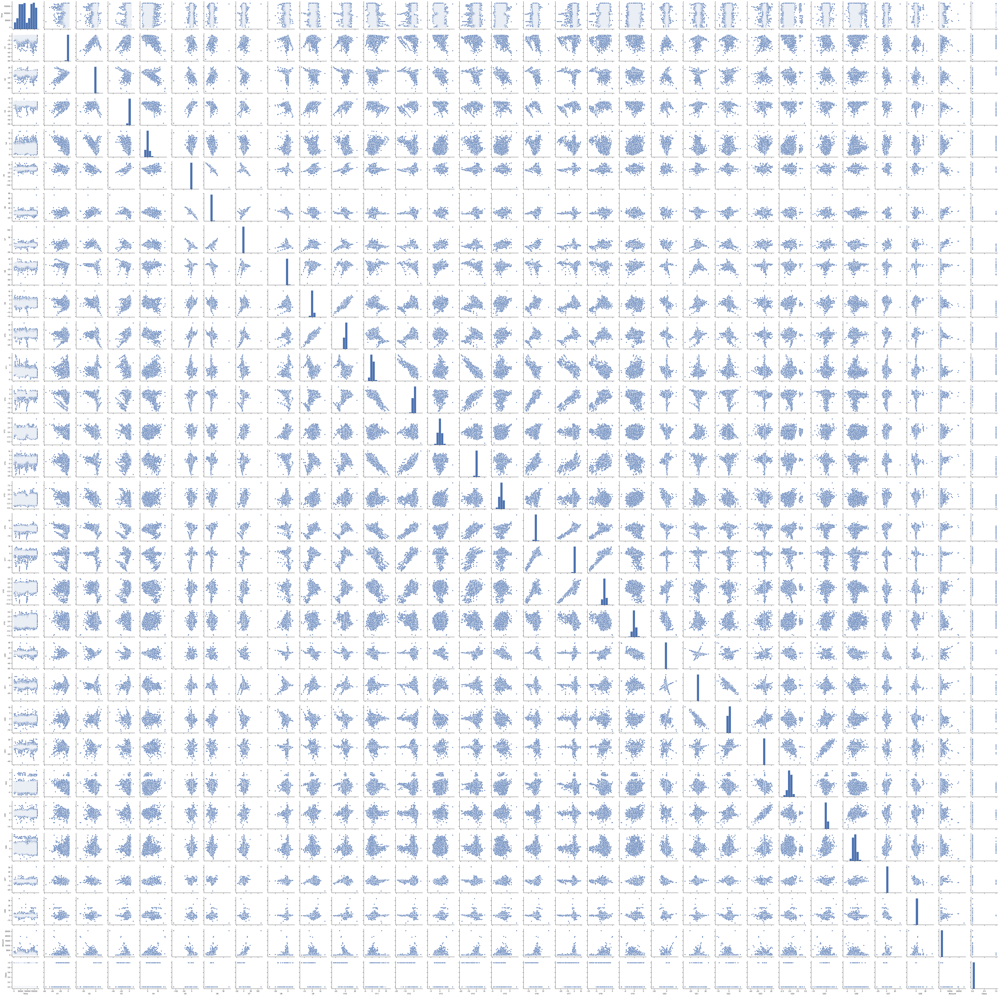

In [ ]:
# Scatterplot matrix
sns.set(style="ticks")
sns.pairplot(data)

In [ ]:
# Split training and testing dataset
X = data.drop(columns="Class")
y = data["Class"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, stratify=y)

## Evaluation metrics with precision and recall

In [ ]:
def evaluate(y_test, y_pred):
    # precision true positive / (true positive + false positive)
    # recall: true positive  / (true positive + false ne)
    precision, recall, _ = precision_recall_curve(y_test, y_pred)
    # f1 = 2 * (precision * recall) / (precision + recall)
    f1 = f1_score(y_test, y_pred)
    #auc_score = auc(precision, recall)
    return precision, recall, f1

In [ ]:
def summarizeGridSearchResult(grid_result):
    """
    A helper function to summarize the grid search result
    
    Parameters:
    
    grid_result: an object returned by the GridSearchCV function. 
    
    Returns:
    
    None
    """
    # summarize results
    print("The Best F1 score is : %f with parameter(s) %s" % (grid_result.best_score_, grid_result.best_params_))
    means = grid_result.cv_results_['mean_test_score']
    stds = grid_result.cv_results_['std_test_score']
    params = grid_result.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print("%f (%f) with: %r" % (mean, stdev, param))
    return None

## Classic classification algorithms
* Linear Algorithms: Linear Algorithms: Logistic Regression (LR),  Linear Discriminant Analysis (LDA), SGDClassifier (SGDC), Linear Support Vector Machines (Linear SVC)
* Nonlinear Algorithms: Classification and Regression Trees (CART), Gaussian Naive Bayes (NB) and k-Nearest Neighbors (KNN).

In [ ]:
# Test on more algorithms
models = []
models.append(('LR' , LogisticRegression(random_state = seed))) # Specify 'sag' for a faster performance to deal with large dataset.
models.append(('LDA' , LinearDiscriminantAnalysis()))
models.append(('KNN' , KNeighborsClassifier()))
models.append(('CART' , DecisionTreeClassifier(random_state = seed)))
models.append(('NB' , GaussianNB()))
models.append(('SVM' , LinearSVC(random_state = seed)))
models.append(('SGDC', SGDClassifier()))
# evaluate each model in turn
results = []
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision, recall, f1 = evaluate(y_test,y_pred)
    results.append((name, precision, recall, f1))

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


## Comparison among all algorithms in terms of AUPRC

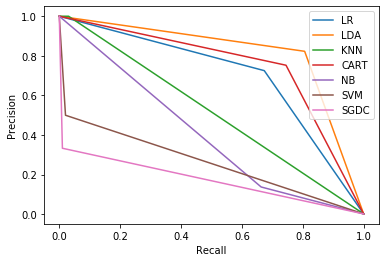

In [ ]:
# plot the precision-recall curves
for name, precision, recall, f1 in results:
    plt.plot(recall, precision, label=name)
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

## Will standardization improve the algorithm performance?
### Yes, KNN has greatly improved its performance based the area under precision and recall curve. 

In [ ]:
# Tried standardizing the data to see if there is a performance gain.
std_models = []
std_models.append(('ScaledLR', Pipeline([('Scaler' , StandardScaler()),( 'LR',
LogisticRegression(random_state = seed))]))) 
std_models.append(('ScaledLDA', Pipeline([('Scaler' , StandardScaler()),('LDA',
LinearDiscriminantAnalysis())])))
std_models.append(('ScaledKNN', Pipeline([('Scaler' , StandardScaler()),('KNN',
KNeighborsClassifier())])))
std_models.append(('ScaledCART', Pipeline([('Scaler' , StandardScaler()),('CART',
DecisionTreeClassifier(random_state = seed))])))
std_models.append(('ScaledNB' , Pipeline([('Scaler' , StandardScaler()),('NB',
GaussianNB())])))
std_models.append(('ScaledSVM' , Pipeline([('Scaler' , StandardScaler()),('SVM',
LinearSVC(random_state = seed))])))
std_models.append(('ScaledSGDC', Pipeline([('Scaler' , StandardScaler()),('SVM',
SGDClassifier())])))
# evaluate each model in turn
std_results = []
for name, model in std_models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision, recall, f1 = evaluate(y_test,y_pred)
    std_results.append((name, precision, recall, f1))

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


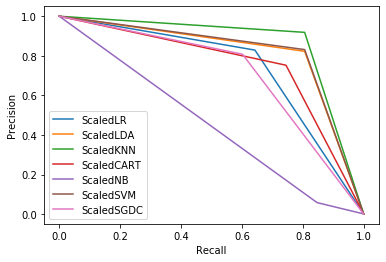

In [ ]:
# plot the precision-recall curves
for name, precision, recall, f1 in std_results:
    plt.plot(recall, precision, label=name)
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

## Algorithm Tuning for KNN
### We see that setting k=3 gives us the best f1 score 

In [ ]:
# Tuning scaled KNN
n_neighbors = [1,3,5,6,7,8,9,10,11] # default is 5
param_grid = dict(n_neighbors=n_neighbors)
scoring = 'f1' # We use f1 to be our scoring metrics as it is a measure of how well our model performs based on the precision and recall
knn = KNeighborsClassifier()
grid = GridSearchCV(estimator = knn, param_grid = param_grid, scoring = scoring) # Note the gridsearchCV will use 5-fold CV by default


In [ ]:
# Fit the model with standardized data
grid_result = grid.fit(scaledX_train, y_train)
summarizeGridSearchResult(grid_result)

## Will ensemble methods improve classification performance?
### We see that extra tree and random forest classifier are overall better ensemble methods with 0.86 f1 score 

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier

In [ ]:
# Test on more algorithms
ensembles_models = []
ensembles_models.append(('BC' , BaggingClassifier(KNeighborsClassifier(n_neighbors=3),random_state = seed))) # Specify 'sag' for a faster performance to deal with large dataset.
ensembles_models.append(('RF' , RandomForestClassifier(random_state=seed)))
ensembles_models.append(('AB' , AdaBoostClassifier(random_state=seed)))
ensembles_models.append(('GB' , GradientBoostingClassifier(random_state = seed)))
ensembles_models.append(('ET' , ExtraTreesClassifier(random_state = seed)))
# We select the top 3 models based on the original data without standardization for the voting classifier
clf1 = LogisticRegression(random_state = seed)
clf2 = DecisionTreeClassifier(random_state = seed)
clf3 = LinearDiscriminantAnalysis()
ensembles_models.append(('VT', VotingClassifier(estimators=[('LR', clf1), ('CART', clf2), ('LDA', clf3)], voting='hard')))

# evaluate each model in return
ens_results = []
for name, model in ensembles_models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision, recall, f1 = evaluate(y_test,y_pred)
    ens_results.append((name, precision, recall, f1))

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


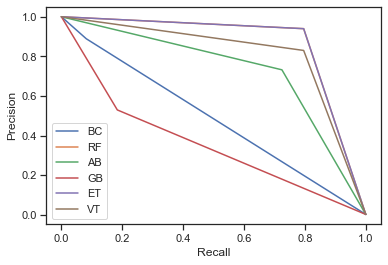

In [ ]:
# plot the precision-recall curves
for name, precision, recall, f1 in ens_results:
    plt.plot(recall, precision, label=name)
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

## Algorithm Tuning for ExtraTreeClassifier

In [ ]:
etclf = ExtraTreesClassifier(random_state = seed)
n_estimators = [10,50,100,150,200,300,500,1000] # default is 5
params = dict(n_estimators=n_estimators)
grid_et = GridSearchCV(estimator=etclf, param_grid=params, scoring = 'f1')
grid_et_result = grid_et.fit(X_train, y_train)
summarizeGridSearchResult(grid_et_result)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


The Best F1 score is : 0.849129 with parameter(s) {'n_estimators': 100}
0.830595 (0.010106) with: {'n_estimators': 10}
0.843186 (0.013019) with: {'n_estimators': 50}
0.849129 (0.009361) with: {'n_estimators': 100}
0.838686 (0.014273) with: {'n_estimators': 150}
0.841970 (0.015615) with: {'n_estimators': 200}
0.843036 (0.018054) with: {'n_estimators': 300}
0.845512 (0.019256) with: {'n_estimators': 500}
0.845427 (0.020942) with: {'n_estimators': 1000}


### Simple neural network

In [ ]:
# Building a simple neural network model
def simpleNNModel(trainX,trainY,loss='binary_crossentropy',optimizer='adam'):
    # Define the model
    model = Sequential()
    model.add(Dense(10, input_dim=30, activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss=loss, optimizer=optimizer, metrics=['acc'])
    model.fit(trainX, trainY, epochs=10)
    return model

In [ ]:
nnmodel = simpleNNModel(X_train,y_train)
y_pred = nnmodel.predict_classes(X_test)

Epoch 1/10
227845/227845 [==============================] - 16s 69us/step - loss: 2.4993 - acc: 0.9946
Epoch 2/10
227845/227845 [==============================] - 11s 48us/step - loss: 0.8319 - acc: 0.9969
Epoch 3/10
227845/227845 [==============================] - 11s 50us/step - loss: 0.3932 - acc: 0.9973
Epoch 4/10
227845/227845 [==============================] - 11s 48us/step - loss: 0.3560 - acc: 0.9976
Epoch 5/10
227845/227845 [==============================] - 11s 49us/step - loss: 0.1526 - acc: 0.9979
Epoch 6/10
227845/227845 [==============================] - 11s 48us/step - loss: 0.1355 - acc: 0.9979
Epoch 7/10
227845/227845 [==============================] - 10s 45us/step - loss: 0.1159 - acc: 0.9978
Epoch 8/10
227845/227845 [==============================] - 10s 45us/step - loss: 0.0328 - acc: 0.9985
Epoch 9/10
227845/227845 [==============================] - 11s 48us/step - loss: 0.0956 - acc: 0.9979
Epoch 10/10
227845/227845 [==============================] - 10s 46us/ste

In [ ]:
y_pred = nnmodel.predict_classes(X_test)
nn_precision = precision_score(y_test, y_pred)
print('Precision: %f' % nn_precision)
nn_recall = recall_score(y_test, y_pred)
print('Recall: %f' % nn_recall)
nn_f1 = f1_score(y_test, y_pred)
print('F1 score: %f' % nn_f1)

Precision: 0.578947
Recall: 0.112245
F1 score: 0.188034
